# What is Generic, what is specialized?

We will create a custom nxn matrix that depends on n paramaters, not $n^2$.  What should we be able to inherit from general linear algebra what should be specialized for this custom structure?  Truly good mathematical software thinks carefully about this very question.

In [1]:
using Distributed
addprocs(parse(Int, ENV["SLURM_CPUS_PER_TASK"]))

4-element Array{Int64,1}:
 2
 3
 4
 5

In [2]:
;nvidia-smi

Mon Sep 17 13:46:21 2018       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 396.37                 Driver Version: 396.37                    |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla V100-PCIE...  On   | 00000000:02:00.0 Off |                    0 |
| N/A   35C    P0    26W / 250W |      0MiB / 16160MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [3]:
; whoami

aedelman


In [42]:
; squeue -u aedelman

             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
             10007       gpu JupyterN aedelman  R    1:44:56      1 r8-pc-c22-34


In [4]:
using LinearAlgebra
using DistributedArrays

In [5]:
using CuArrays

In [28]:
1+1

2

In [4]:
nworkers()

4

In [ ]:
# # Set device to be used on each worker
# gpuworkers = Int[]
# asyncmap(collect(zip(workers(), CUDAnative.devices()))) do (p, d)
#     push!(gpuworkers, p)
#     remotecall_wait(() -> CUDAnative.device!(d), p)
#     nothing
# end

Let's create a custom nxn matrix that depends on n paramaters, not $n^2$: <br>

C = diag(v) + v*v'

Here M.v will denote the parameters that M depends on. <br>
This is not a sparse matrix, but dense linear algebra clearly does not apply. Good programming is about taking advantage of structure.

# Build a Custom Type

In [ ]:
## This would work, but we'll add a few fancy features
## struct Custom
##     v::Vector
## end

In [ ]:
# struct Custom{T, V} <: AbstractMatrix{T}
#      v::V
#      Custom(v::V) where V<:AbstractVector{T} where T = new{T, V}(v)
# end

In [1]:
struct Custom{T, V<:AbstractVector{T}} <: AbstractMatrix{T}
   v::V
end

We added the type parameter {T} and the subtype AbstractMatrix.  The type parameters says that the vector could be made from any type: Int, Float, BigInt, Quaternion,... <br>

The subtype of AbstractMatrix automatically gives some functionality of size and getindex methods are defined as in the next cell.

In [2]:
Base.size(c::Custom)         =   length(c.v), length(c.v)
Base.getindex(c::Custom,i,j) =   c.v[i]*(i==j)  + c.v[i]*c.v[j]

In [3]:
C = Custom([1,2,3])

3×3 Custom{Int64,Array{Int64,1}}:
 2  2   3
 2  6   6
 3  6  12

In [7]:
Matrix(C)

3×3 Array{Int64,2}:
 2  2   3
 2  6   6
 3  6  12

In [ ]:
cC = Custom(CuArray([1,2,3]))

In [8]:
dC = Custom(distribute([1,2,3]))

3×3 Custom{Int64,DArray{Int64,1,Array{Int64,1}}}:
 2  2   3
 2  6   6
 3  6  12

In [9]:
M = Matrix(C)

3×3 Array{Int64,2}:
 2  2   3
 2  6   6
 3  6  12

In [10]:
Matrix(dC)

3×3 Array{Int64,2}:
 2  2   3
 2  6   6
 3  6  12

Notice the different types. C would generally store n numbers, M would store $n^2$ numbers.

In [ ]:
C * [1,2,3] # Matrix times vector automatically works though may not be efficient for large n.

Why did this automatically work?  The subtyping as an AbstractMatrix and the definition of getindex and size is all that was needed.

In [11]:
# Matrix times vector with O(n) operations (3n multiplications , 2n additions)
Base.:*(c::Custom, x::Vector) = (c.v) .* x + c.v * (c.v'x)

In [12]:
C * [1,2,3] # same answer, now efficient

3-element Array{Int64,1}:
 15
 32
 51

# Compute the largest eigenvalue

Having any matrix times vector (efficient or not), is enough to get the largest singular value = largest eigenvalue using the Arnoldi method from Arpack (the Arnoldi package).

In [ ]:
#using Pkg
#Pkg.add("Arpack")
# using Arpack
# svds(C,nsv=1)[1].S

We can also use eigmax defined for Symmetric matrices.

In [ ]:
S = Symmetric(M)
eigmax(S)

None of these are efficient on this structure.

# Eigmax Efficiently with Newton

With some linear algebra, we can see that $\det(Diag(v)+vv'-λI)=0$ is equivalent to 
$$ f(\lambda) = 1 + \sum_i \frac{v_i^2}{v_i-λ}=0.$$
The largest root $\lambda$ of the above nonlinear equation is the largest eigenvalue.

In [8]:
f(c::Custom)  = λ ->  1 + mapreduce((v) -> v^2 / (v - λ)  , +, c.v)
f′(c::Custom) = λ ->      mapreduce((v) -> v^2 / (v - λ)^2, +, c.v)

f′ (generic function with 1 method)

In [14]:
function LinearAlgebra.eigmax(c::Custom; tol = eps(2.0), debug = false)
    x0 = maximum(c.v) + maximum(c.v)^2
    δ = f(c)(x0)/f′(c)(x0)
    while abs(δ) > x0 * tol               
        x0 -= δ
        δ = f(c)(x0)/f′(c)(x0) # Newton's Method
        debug && println("x = $x0, δ = $δ") # Debugging
    end
    x0
end

The function $f(λ)$ is concave on $(v_\max,\infty)$ and negative on $(v_\max,\lambda_\max)$.
Thus if we start Newton's method on $(v_\max,\lambda_\max)$, we are guaranteed to converge monotonically to the largest eigenvalue.  It is easy to see that $v_\max + v_\max^2$ is in this interval, so it seems like a good place to start the iteration.

# Compare Timings

In [15]:
N = 10_000_000

10000000

In [16]:
v = randn(N)*.1;

In [17]:
C = Custom(v);

In [18]:
dC = Custom(distribute(v));

In [ ]:
cC = Custom(CuArray(v));

In [ ]:
# dcC = Custom(map_localparts(CuArray, distribute(v, gpuworkers)));

In [21]:
@time eigmax(C) # run twice, no comparison

  0.839479 seconds (6 allocations: 192 bytes)


100018.50513662695

In [22]:
@time eigmax(dC)

  0.440158 seconds (21.87 k allocations: 2.337 MiB)


100018.50513662695

In [ ]:
@time eigmax(cC)

In [ ]:
# @time eigmax(dcC)

# A Closer Look at Newton

In [ ]:
eigmax(C, debug=true)

In [23]:
using Plots
pyplot()

Plots.PyPlotBackend()

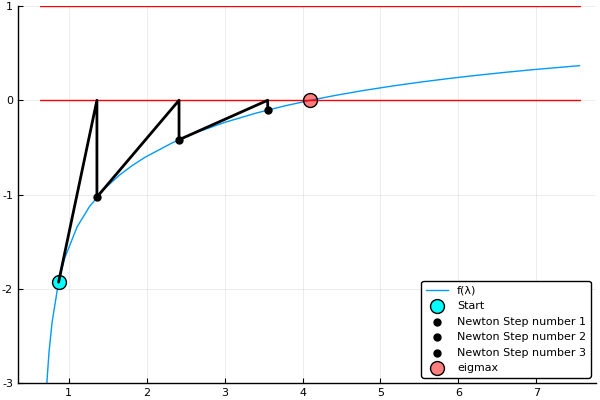

In [26]:
n=5
v = randn(n)
C = Custom(v)

xmin = maximum(v)
xmax = 2*eigmax(C) - xmin

plot(f(C),xmin,xmax, ylim=(-3,1), label="f(λ)")
plot!(x->0,xmin,xmax,color=:red, label="")
plot!(x->1,xmin,xmax, color=:red, label="")


x = xmin + xmin^2 
scatter!([x],[f(C)(x)],color=:cyan, label="Start", markersize=10)
for k=1:3
    xold = x
    x -= f(C)(x)/f′(C)(x) 
    plot!([xold,  x, x],[f(C)(xold), 0, f(C)(x)],width=2,color=:black,label="")
    scatter!([x],[f(C)(x)],color=:black,markersize=5,label="Newton Step number $k")
end
scatter!([eigmax(C)],[0.0],color=:red,markersize=10,label="eigmax",alpha=.5)